In [ ]:
#Used Car Listings-Features and Price Prediction
#visualization of Dataset.
#DATA = https://www.kaggle.com/datasets/tawfikelmetwally/automobile-dataset
#please note analysis would not be accurate as dataset is inconsitent. This is merely for visualization purposes.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.palettes import Spectral4
from bokeh.io import output_notebook
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import pickle

In [2]:
# Load the CSV file
file_path = r'C:\Users\T blqck\projects\Used Car Listings.csv'
data = pd.read_csv(file_path)

# Preview the columns
print(data.head())

# Display the column names
print(data.columns)


        brand                      model    year  mileage  \
0       Mazda               CX-9 Touring  2022.0   6580.0   
1        Alfa  Romeo Stelvio 4DR SUV AWD  2018.0  62717.0   
2   Chevrolet  Silverado 1500 Limited LT  2022.0  15463.0   
3        Land  Rover Range Rover P400 SE  2022.0   1281.0   
4  Mitsubishi     Outlander Sport 2.0 SE  2021.0  36727.0   

                                      engine  engine_size       transmission  \
0                 2.5L I4 16V GDI DOHC Turbo          2.5  6-Speed Automatic   
1  Twin Turbo Premium Unleaded V-6 2.9 L/176          2.9          Automatic   
2                        5.3L V8 16V GDI OHV          5.3          Automatic   
3                 3.0L I6 24V GDI DOHC Turbo          3.0          Automatic   
4                      2.0L I4 16V MPFI DOHC          2.0      Automatic CVT   

   automatic_transmission fuel_type         drivetrain  ...  leather_seats  \
0                     1.0  Gasoline   Four-wheel Drive  ...            1.0

In [3]:
#Explore categorical features like 'brand', 'model', 'fuel_type', and 'drivetrain'. Calculate the frequency distribution of these features to see the distribution of different categories.

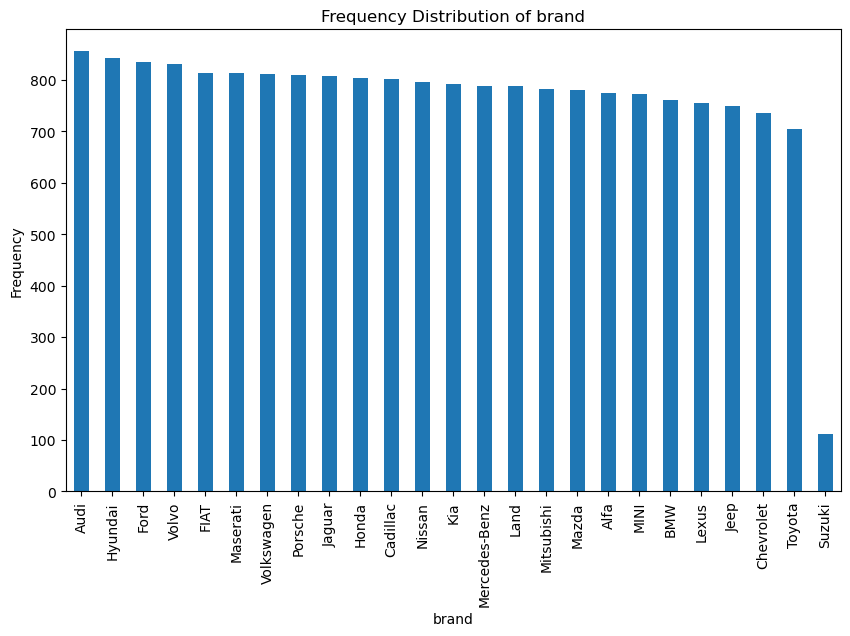

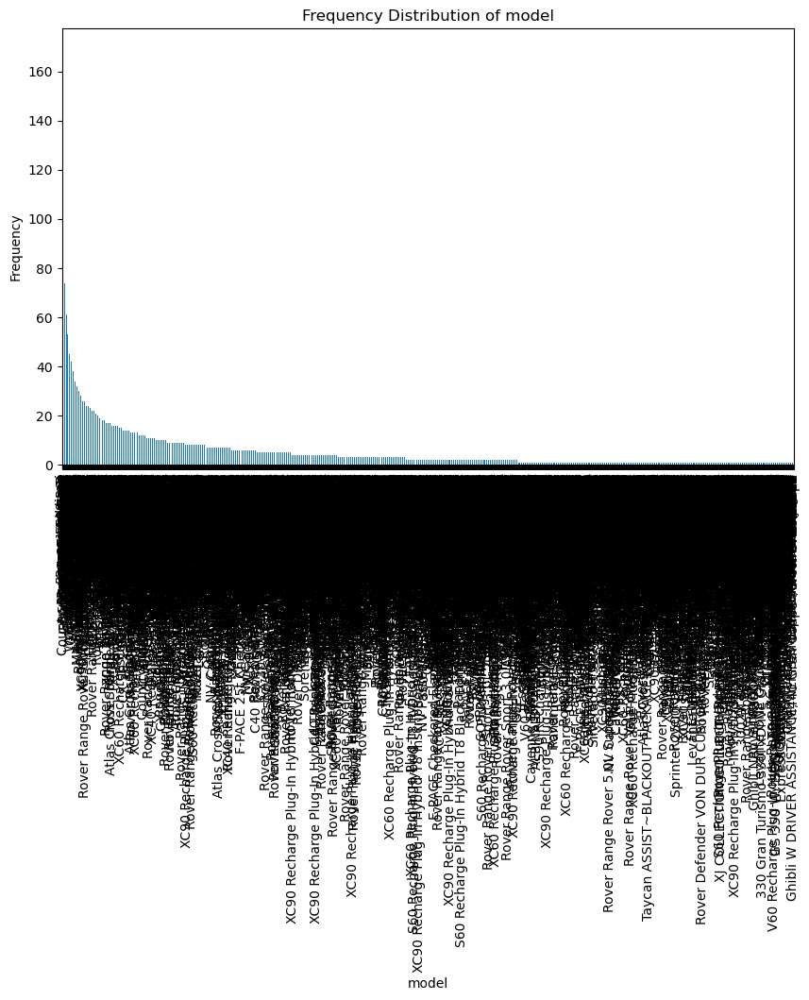

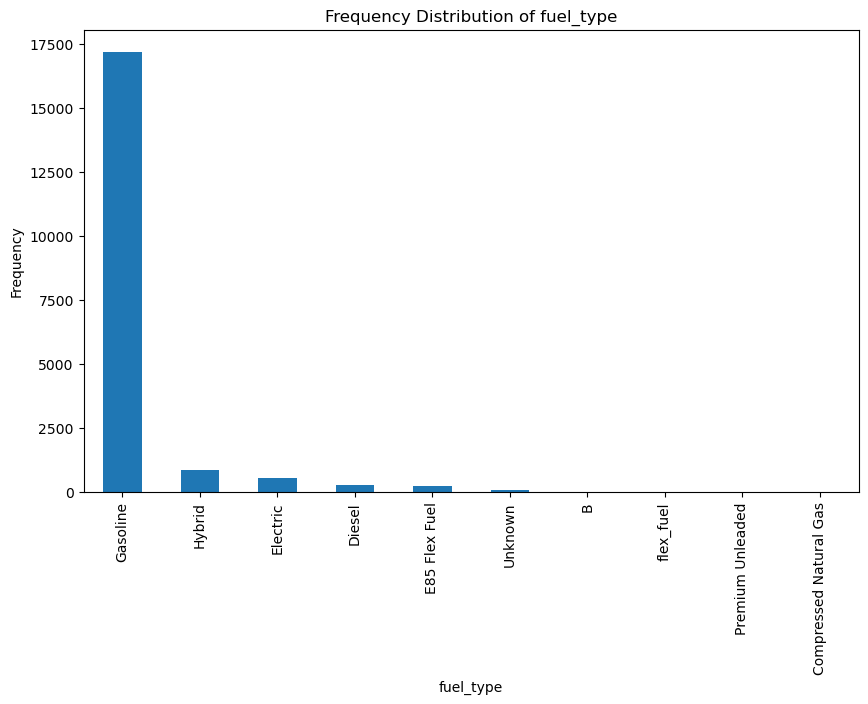

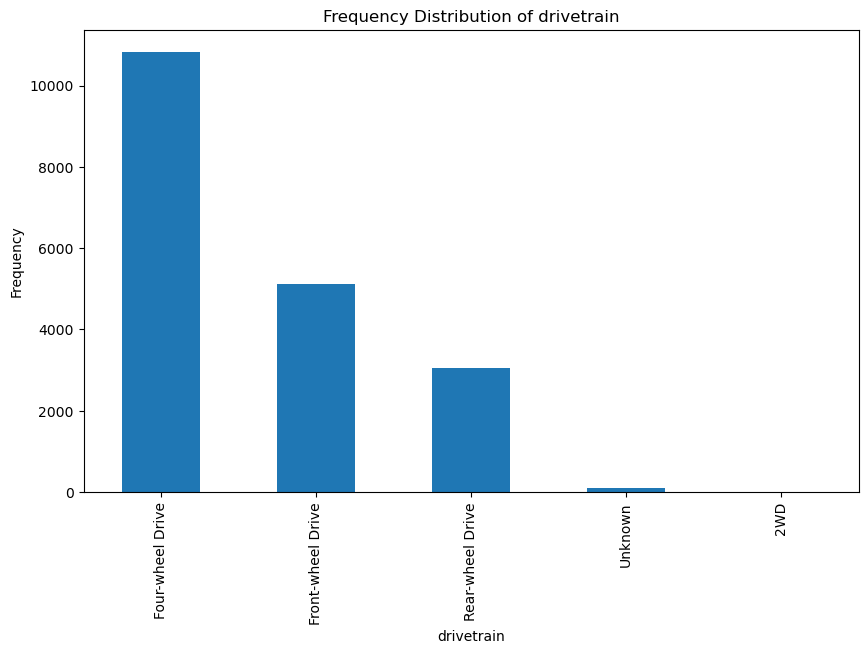

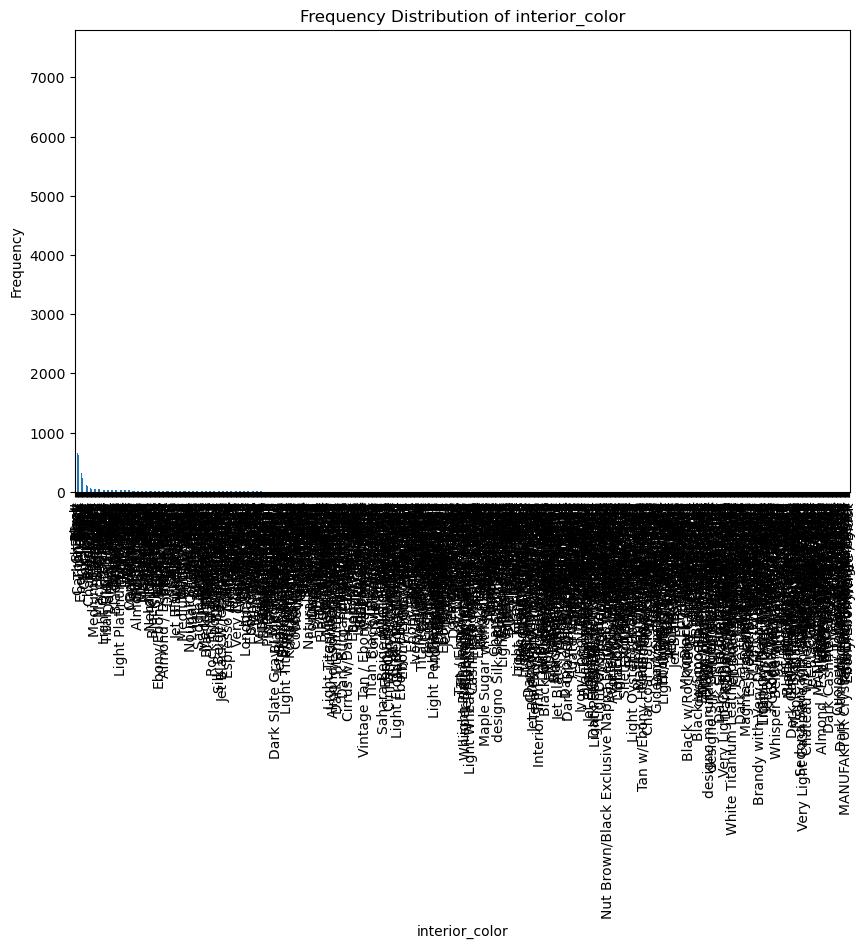

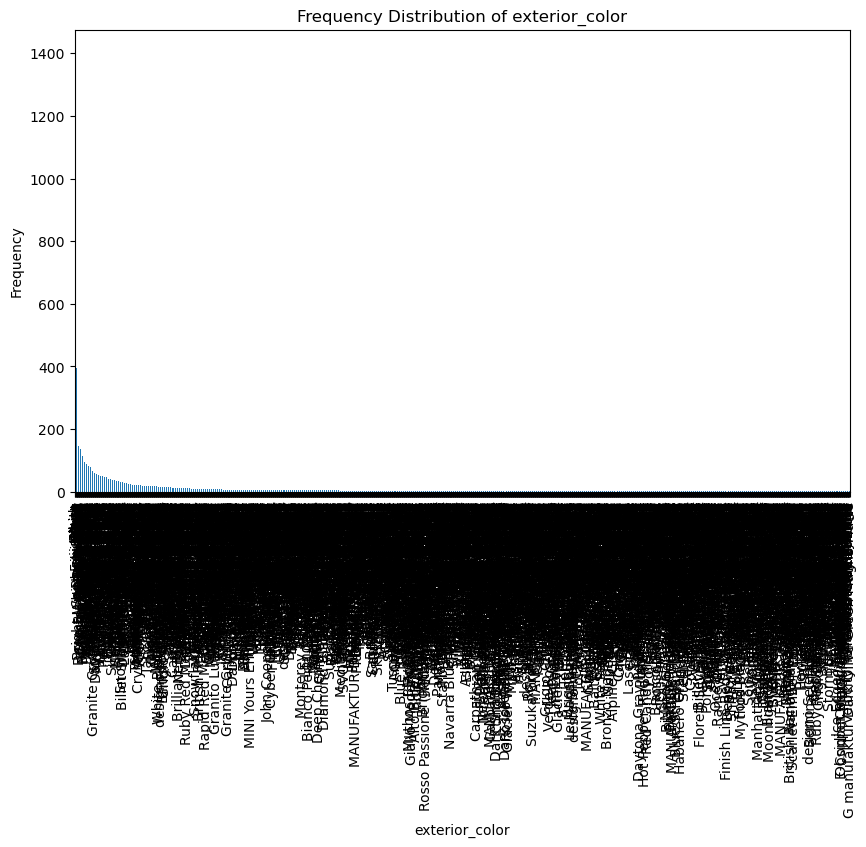

TypeError: Could not convert 39750189003232979998535001788147995159002894978999589952169823851343441190074999369958197724999589984999039521669226299084888307198995898503899913499620006002598008688033999683353899076999114991678426218329983499874886419976650024987164634290028484249913099973900439863797767577277472200006340523800565902269526590289952698866998264902499951690274949988833990863252150587577338693970063705224356099324887114995614803429936000279891499511312024700490959397758640359978500374067998752000339628599567885103950159983348136998754862877185888910003200075626249981249545999154883899969171139281239120999275001898861843175000059795499756771826500747492299911875249857999528500409953299776400345002699949890266782097729995153503396647028437091299953285839994319884499444955358901899550990649991445859990245002629348215261893849557480279912248536150399008887227295499875498841500237887548860487422433099554795500003249816000269868100027143770002925061835555779499969950159993599943990109990669987474815499599887996119999282956092917978299874459515487379972716168880429914599539499167505798846998245901499958999895902991188996638883891656992452593860073895350003599836995283672499947999564944450022960372788993428994228707097721995359906298211295290662495018948349504125053340139941777429995197973979927448259987140065241607508998848499499954899569960624951600055880259883798826560314898848682120870543399924888539002665318777294994098723489569956999542887239096499562867379952025621998625004268848699929984504039984640008990328886597758995169951199993097844995131691149959999846991389016239811981537632476212097725995500002590034498427505499569998309912499862998749981450045000639528886340824249501499519998245752999518988292493165099990246161897771900539983795057291458884749512840286743298810999159001899512499845911249994799134881899951920937295158804629933926387123839919990578735271123399557985596236900649962650022250769913499744496503881099132900209003899842295810003500033988475523175031995324004799947995849889198587991249772599951998359956048844410508906000023113436672348894900343597189732977669952299053997474174796032995759984849318995269774999514997877981884338887299930998209905190043354259902899513450015999586977571622515032192629953499087409279983370038198762264470057999312511699876995699009500036787106999749993999529999169192174826019269984499542045769989900512912799763299255932969035910514653957760499229852200067888159951250039990259358890079995319955850026419463915980038975940457424070943499993700054999319005788881475990003065619821835654299933968748123720039477446956499390763718777799032638299905941179953257822900510002345056998349005595066996329952749556634312771599931982639991800012994102472337792990655772647714316119992838535495249952798830999223506259428709590632399534999309953885045885577923688526998249909499678592134031301162399510099959995286997990258154389756998369875699011995333962499836604379955799958581176774190049995770736399522985139994497713275023998447243399534995399108394269590427874794879977849905499929998799991799889881809983999860747409945928239950509984999838962249954099821988424003699049900144954990034414299438499930103234885149552395163004399844997175944596079999459996999615008489021998379983650038500159003455114400573954999548549554896199944136599881798931590585007441950998584166812428989833921499561399876663058917888465741629913999534995309982798587885109954909049987479901175026950649963676521599257896181599985150023495129962160002799838998419952649121821542996790033500459991496554989710004799723809139003350077777389554350056498539843999532991355787299839750499903599554962369982524825870599927299569690478445898779994090030990999981789932791291273339030684344992095268495169993371512973268872729649998ot Priced30906627424299884998559912430095070119999 to numeric

In [4]:
# Categorical features
categorical_features = ['brand', 'model', 'fuel_type', 'drivetrain', 'interior_color', 'exterior_color']

# Frequency distribution of categorical features
for feature in categorical_features:
    freq_dist = data[feature].value_counts()
    plt.figure(figsize=(10, 6))
    freq_dist.plot(kind='bar')
    plt.title(f'Frequency Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

# Average price by brand
average_price_by_brand = data.groupby('brand')['price'].mean().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
average_price_by_brand.plot(kind='bar')
plt.title('Average Price by Brand')
plt.xlabel('Brand')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()

# Average price by model
average_price_by_model = data.groupby('model')['price'].mean().sort_values(ascending=False)[:10]
plt.figure(figsize=(12, 6))
average_price_by_model.plot(kind='bar')
plt.title('Average Price by Model (Top 10)')
plt.xlabel('Model')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# some are a bit messy but if we is to select a subset of values based on certain criteria or to aggregate them.

# For example, let's modify the code to show the frequency distribution of the top 10 most common models instead of all models:

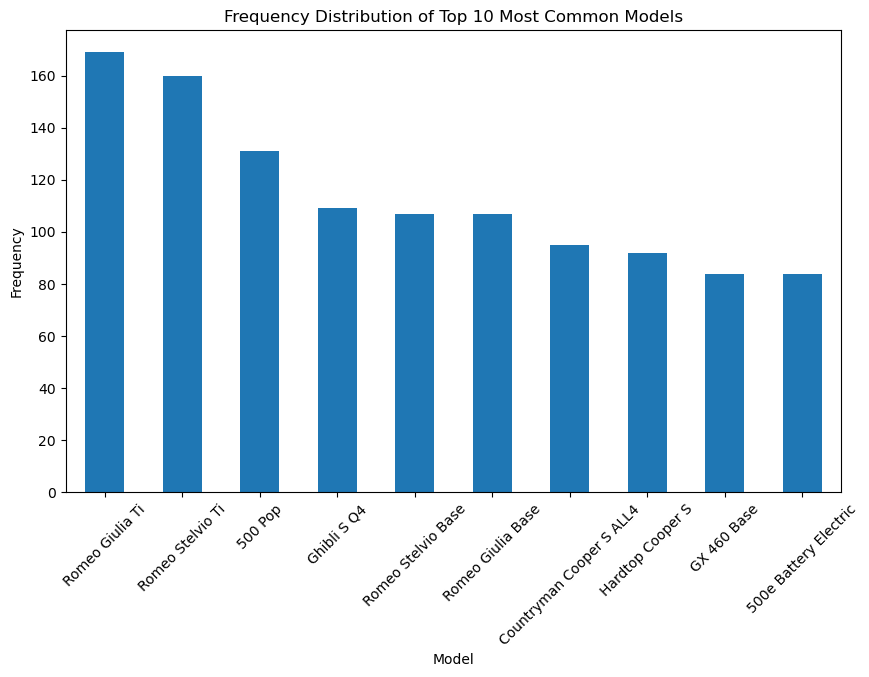

In [5]:
# Frequency distribution of top 10 most common models
top_10_models = data['model'].value_counts().head(10)
plt.figure(figsize=(10, 6))
top_10_models.plot(kind='bar')
plt.title('Frequency Distribution of Top 10 Most Common Models')
plt.xlabel('Model')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

In [6]:
# Select the numerical columns
numerical_columns = ['year', 'mileage', 'engine_size', 'price']

# Calculate basic statistics
statistics = data[numerical_columns].describe()

# Print the statistics
print(statistics)

               year        mileage   engine_size
count  19107.000000   19107.000000  17860.000000
mean    2017.773120   47947.087403      2.973191
std        4.996385   38285.061200      5.478008
min     1962.000000       0.000000      0.000000
25%     2016.000000   19307.000000      2.000000
50%     2019.000000   39141.000000      2.500000
75%     2021.000000   68431.500000      3.500000
max     2024.000000  383614.000000    390.000000


In [ ]:
#In the code snippet above, we are selecting the numerical columns from the dataset and calculating basic statistics for them. The objective is to understand the distribution and summary statistics of these numerical features.

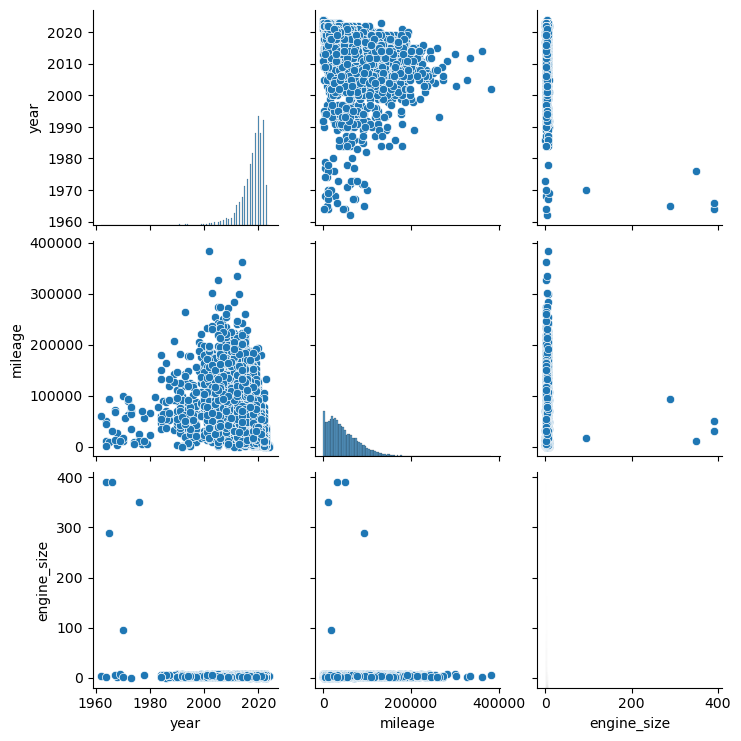

Loading BokehJS ...

In [9]:
# Create scatter plot matrix
sns.pairplot(data[numerical_columns])
# Display the scatter plot matrix
plt.show()

# Create a Bokeh ColumnDataSource
source = ColumnDataSource(data)

# Create a Bokeh figure
p = figure(width=800, height=400, tools='hover', tooltips="@brand @model: @price{$0,0}")

# Add scatter plots
p.scatter(x='mileage', y='price', color='blue', source=source, legend_label='Mileage')
p.scatter(x='year', y='price', color='green', source=source, legend_label='Year')
p.scatter(x='engine_size', y='price', color='red', source=source, legend_label='Engine Size')

# Style the plot
p.xaxis.axis_label = 'Variables'
p.yaxis.axis_label = 'Price'
p.legend.location = 'top_left'

# Show the plot
output_notebook()
show(p)

In [ ]:
# The code snippets create a scatter plot matrix using seaborn and individual scatter plots using Bokeh to visualize relationships and patterns between variables and price.

In [10]:
# Display the numeric summary
print(data[['year', 'mileage', 'engine_size']].describe())

               year        mileage   engine_size
count  19107.000000   19107.000000  17860.000000
mean    2017.773120   47947.087403      2.973191
std        4.996385   38285.061200      5.478008
min     1962.000000       0.000000      0.000000
25%     2016.000000   19307.000000      2.000000
50%     2019.000000   39141.000000      2.500000
75%     2021.000000   68431.500000      3.500000
max     2024.000000  383614.000000    390.000000


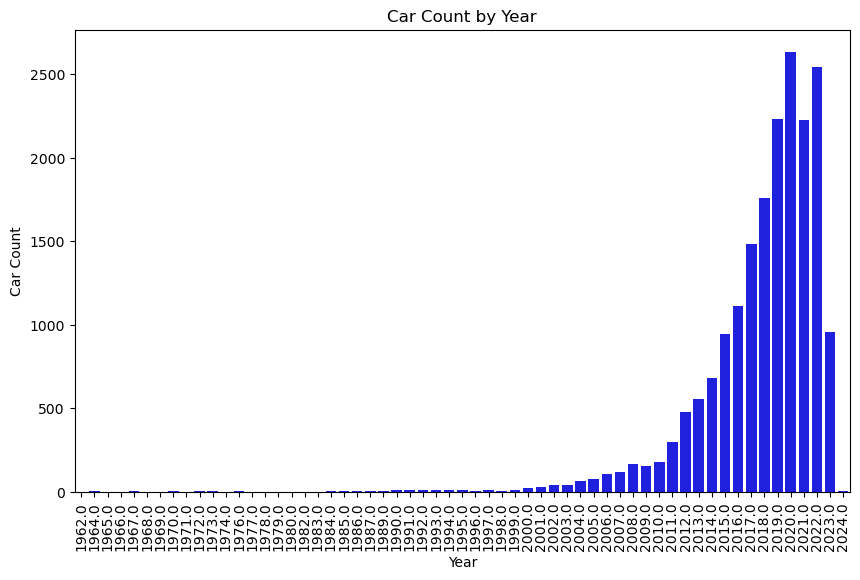

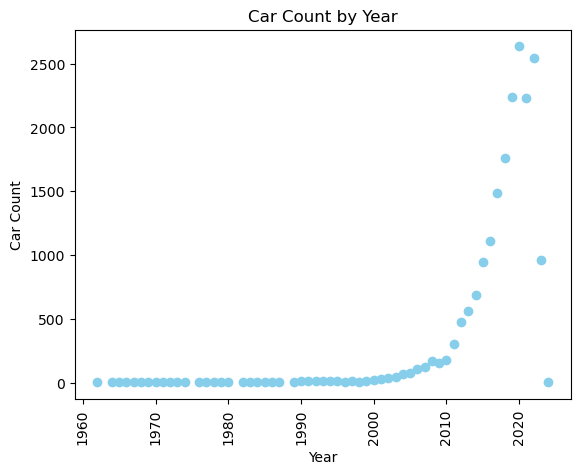

In [16]:
# Calculate car count by year
car_count_by_year = data['year'].value_counts().sort_index()

# Create a bar plot of car count by year
plt.figure(figsize=(10, 6))
sns.barplot(x=car_count_by_year.index, y=car_count_by_year.values, color='blue')
plt.xlabel('Year')
plt.ylabel('Car Count')
plt.title('Car Count by Year')
plt.xticks(rotation=90)
plt.show()

# Create a scatter plot of car count by year
plt.scatter(car_count_by_year.index, car_count_by_year.values, color='skyblue')
plt.xlabel('Year')
plt.ylabel('Car Count')
plt.title('Car Count by Year')
plt.xticks(rotation=90)
plt.show()


In [14]:
#In the code above we are analyzing the distribution of car listings by year to understand trends and popularity, aiming to identify any patterns or changes over time.


#The scatter plot shows an overall increasing trend in car count from 2010, with a minor decline in 2021 followed by growth in 2022.

In [ ]:
# Let's Investigate the distribution of mileage to identify the range and spread of mileage values.

In [17]:
numeric_variables = ['year', 'mileage', 'engine_size']
numeric_data = data[numeric_variables]

print(numeric_data.describe())


               year        mileage   engine_size
count  19107.000000   19107.000000  17860.000000
mean    2017.773120   47947.087403      2.973191
std        4.996385   38285.061200      5.478008
min     1962.000000       0.000000      0.000000
25%     2016.000000   19307.000000      2.000000
50%     2019.000000   39141.000000      2.500000
75%     2021.000000   68431.500000      3.500000
max     2024.000000  383614.000000    390.000000


In [18]:
# Create a Bokeh figure
p = figure(width=800, height=400, tools='hover', tooltips="@brand @model: @price{$0,0}")

# Add scatter plots
p.scatter(x='mileage', y='price', color='blue', source=source, legend_label='Mileage')
p.scatter(x='year', y='price', color='green', source=source, legend_label='Year')
p.scatter(x='engine_size', y='price', color='red', source=source, legend_label='Engine Size')

# Style the plot
p.xaxis.axis_label = 'Variables'
p.yaxis.axis_label = 'Price'
p.legend.location = 'top_left'

# Show the plot
output_notebook()
show(p)




Loading BokehJS ...

In [ ]:
# Based on the analysis of the numeric variables, we observe that the average year is around 2017, mileage varies widely, and engine sizes have a large standard deviation. This suggests a diverse range of used cars in the dataset.

In [ ]:
#Let's do some correlative analysis 

In [21]:
# Select the numerical columns for correlation analysis
numerical_columns = ['year', 'mileage', 'engine_size', 'price']

# Calculate the correlation matrix
correlation_matrix = data[numerical_columns].corr()

# Print the correlation matrix
print(correlation_matrix)

                 year   mileage  engine_size
year         1.000000 -0.561207    -0.183782
mileage     -0.561207  1.000000     0.012661
engine_size -0.183782  0.012661     1.000000


In [ ]:
#The correlation matrix shows that there is a negative correlation between the year and mileage (-0.56), indicating that older cars tend to have higher mileage. 
#The correlation between engine size and mileage is minimal (0.01), suggesting a weak relationship.

#Let's visualize mileage vs price

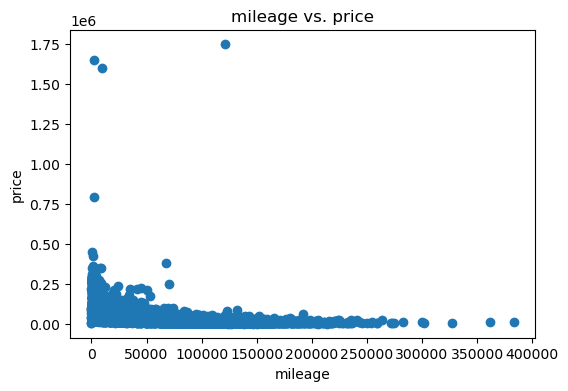

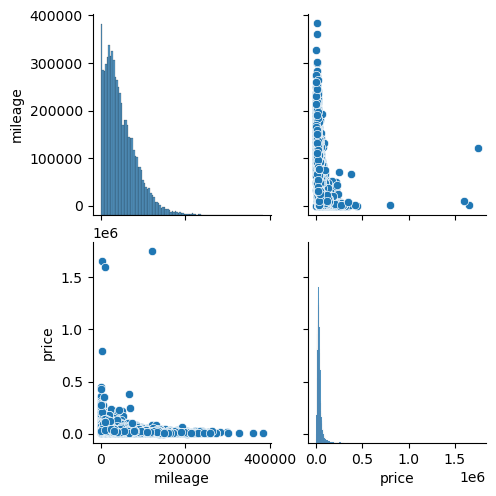

In [23]:
# Select two columns to create a scatter plot
column1 = 'mileage'
column2 = 'price'

# Convert columns to appropriate data types
data[column1] = data[column1].astype(float)
data = data[data[column2] != 'ot Priced']  # Filter out rows with 'ot Priced' value
data[column2] = data[column2].astype(float)

# Create a scatter plot
plt.figure(figsize=(6, 4))
plt.scatter(data[column1], data[column2])
plt.xlabel(column1)
plt.ylabel(column2)
plt.title(f'{column1} vs. {column2}')
plt.show()

# Select columns for the pair plot
columns = ['mileage', 'price']

# Convert columns to appropriate data types
data[columns[0]] = data[columns[0]].astype(float)
data[columns[1]] = data[columns[1]].astype(float)

# Create a pair plot
sns.pairplot(data[columns])
plt.show()

In [ ]:
#The correlation matrix provides insights into the relationships between these variables, helping to identify any patterns or dependencies in the dataset.


#let's see the relationships between year and mileage

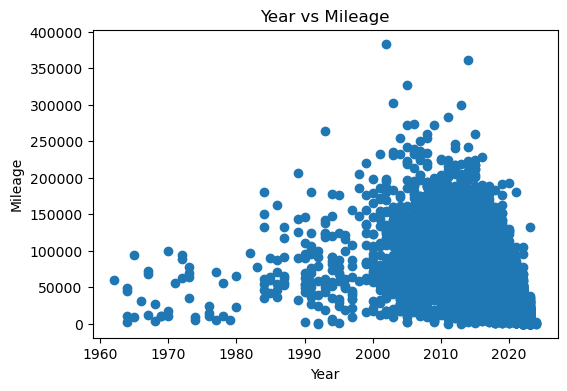

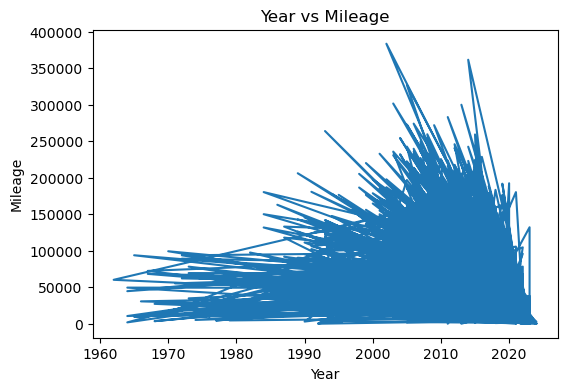

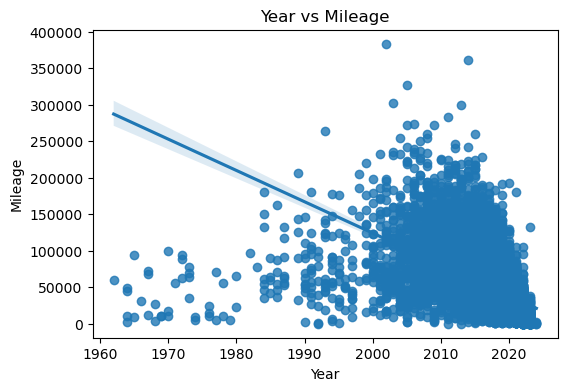

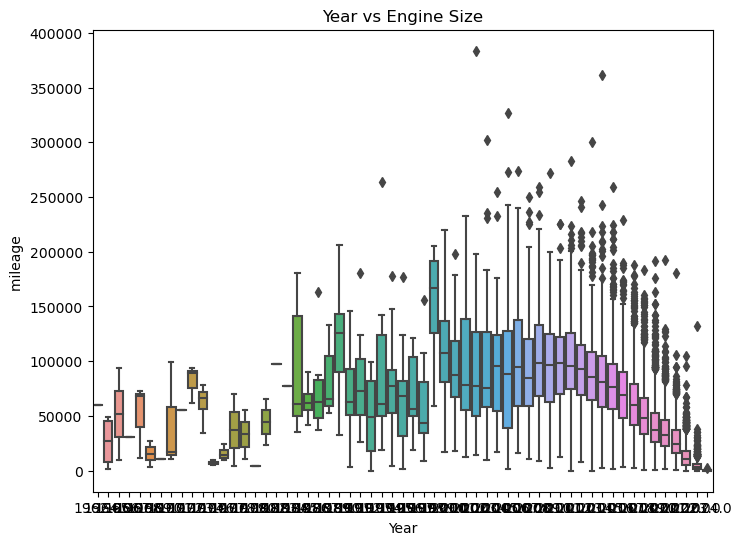

In [24]:
# Create scatter plot for 'year' vs 'mileage'
plt.figure(figsize=(6, 4))
plt.scatter(data['year'], data['mileage'])
plt.xlabel('Year')
plt.ylabel('Mileage')
plt.title('Year vs Mileage')
plt.show()


plt.figure(figsize=(6, 4))
plt.plot(data['year'], data['mileage'])
plt.xlabel('Year')
plt.ylabel('Mileage')
plt.title('Year vs Mileage')
plt.show()


plt.figure(figsize=(6, 4))
sns.regplot(x='year', y='mileage', data=data)
plt.xlabel('Year')
plt.ylabel('Mileage')
plt.title('Year vs Mileage')
plt.show()




plt.figure(figsize=(8, 6))
sns.boxplot(x='year', y='mileage', data=data)
plt.xlabel('Year')
plt.ylabel('mileage ')
plt.title('Year vs Engine Size')
plt.show()

In [ ]:
#The correlation analysis reveals a negative relationship (-0.56) between the year and mileage of used cars. This indicates that as the year increases, the mileage tends to decrease, suggesting that newer cars typically have lower mileage.

In [ ]:
#let's see the relationships between year and engine_size

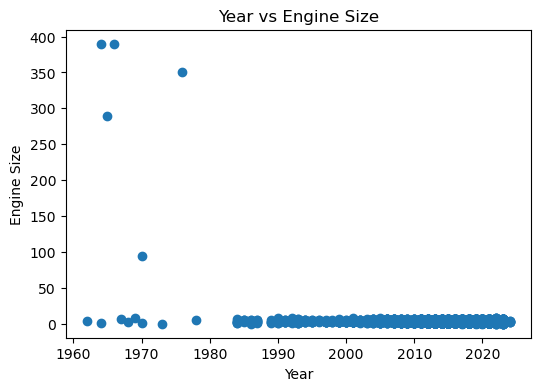

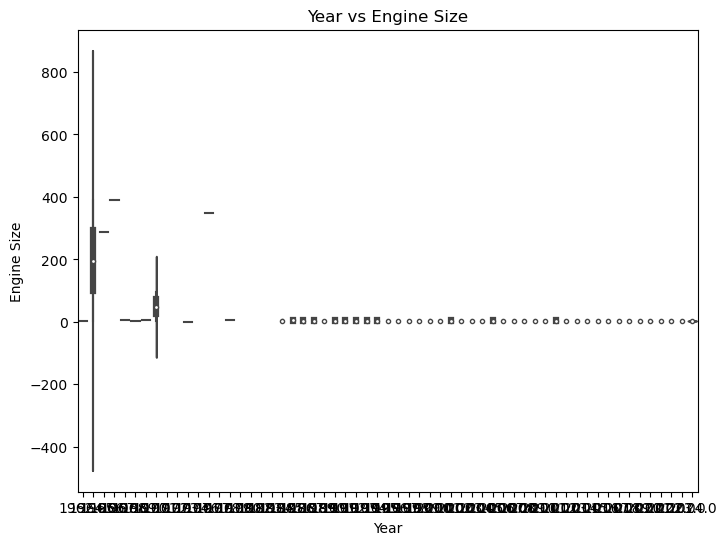

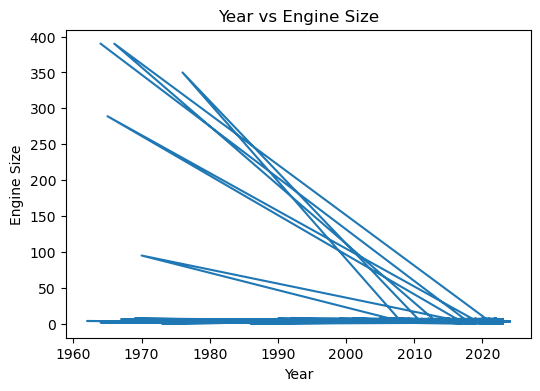

In [25]:
# Create scatter plot for 'year' vs 'engine_size'
plt.figure(figsize=(6, 4))
plt.scatter(data['year'], data['engine_size'])
plt.xlabel('Year')
plt.ylabel('Engine Size')
plt.title('Year vs Engine Size')
plt.show()


plt.figure(figsize=(8, 6))
sns.violinplot(x='year', y='engine_size', data=data)
plt.xlabel('Year')
plt.ylabel('Engine Size')
plt.title('Year vs Engine Size')
plt.show()



plt.figure(figsize=(6, 4))
plt.plot(data['year'], data['engine_size'])
plt.xlabel('Year')
plt.ylabel('Engine Size')
plt.title('Year vs Engine Size')
plt.show()



In [ ]:
# The correlation analysis suggests a weak negative relationship (-0.18) between the year and engine size. This implies that newer cars tend to have slightly smaller engine sizes, but the correlation is not significant.

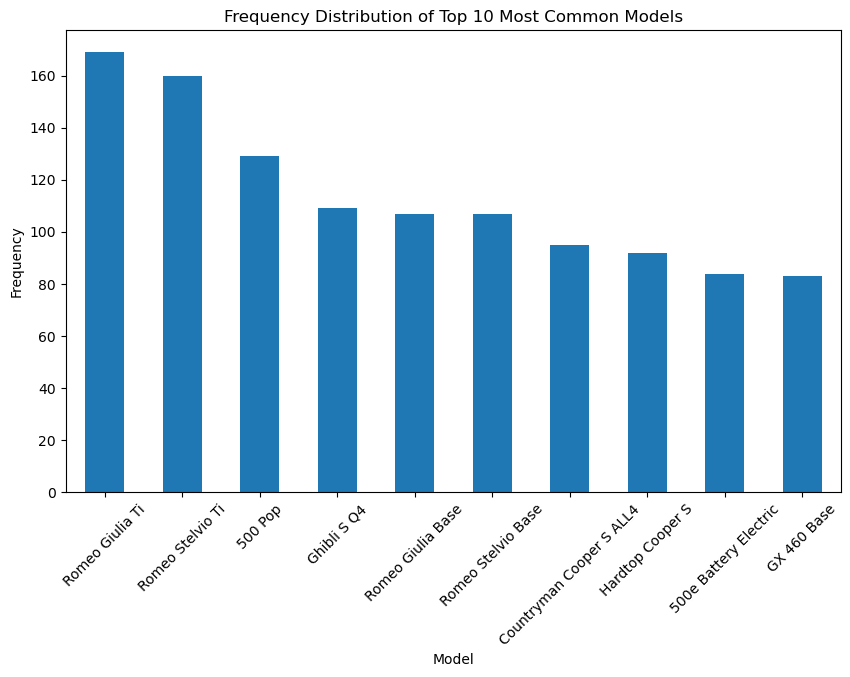

In [26]:

# Frequency distribution of top 10 most common models
top_10_models = data['model'].value_counts().head(10)
plt.figure(figsize=(10, 6))
top_10_models.plot(kind='bar')
plt.title('Frequency Distribution of Top 10 Most Common Models')
plt.xlabel('Model')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# I will build a price prediction model with the data 

Mean Squared Error: 541839430.2821435


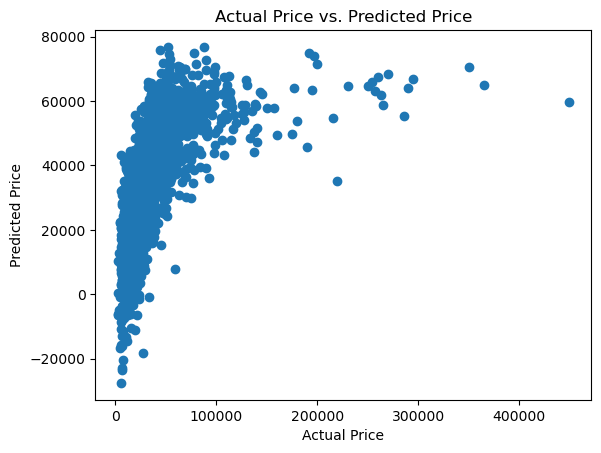

In [27]:
# Preprocess the data
# Drop any unnecessary columns
data = data.drop(['brand', 'model', 'engine', 'transmission', 'fuel_type', 'drivetrain',
                  'interior_color', 'exterior_color'], axis=1)

# Handle missing values (if any)
data = data.dropna()

# Encode categorical variables (if any)
label_encoder = LabelEncoder()
data['automatic_transmission'] = label_encoder.fit_transform(data['automatic_transmission'])
data['damaged'] = label_encoder.fit_transform(data['damaged'])
data['first_owner'] = label_encoder.fit_transform(data['first_owner'])
data['personal_using'] = label_encoder.fit_transform(data['personal_using'])
data['turbo'] = label_encoder.fit_transform(data['turbo'])
data['alloy_wheels'] = label_encoder.fit_transform(data['alloy_wheels'])
data['adaptive_cruise_control'] = label_encoder.fit_transform(data['adaptive_cruise_control'])
data['navigation_system'] = label_encoder.fit_transform(data['navigation_system'])
data['power_liftgate'] = label_encoder.fit_transform(data['power_liftgate'])
data['backup_camera'] = label_encoder.fit_transform(data['backup_camera'])
data['keyless_start'] = label_encoder.fit_transform(data['keyless_start'])
data['remote_start'] = label_encoder.fit_transform(data['remote_start'])
data['sunroof/moonroof'] = label_encoder.fit_transform(data['sunroof/moonroof'])
data['automatic_emergency_braking'] = label_encoder.fit_transform(data['automatic_emergency_braking'])
data['stability_control'] = label_encoder.fit_transform(data['stability_control'])
data['leather_seats'] = label_encoder.fit_transform(data['leather_seats'])
data['memory_seat'] = label_encoder.fit_transform(data['memory_seat'])
data['third_row_seating'] = label_encoder.fit_transform(data['third_row_seating'])
data['apple_car_play/android_auto'] = label_encoder.fit_transform(data['apple_car_play/android_auto'])
data['bluetooth'] = label_encoder.fit_transform(data['bluetooth'])
data['usb_port'] = label_encoder.fit_transform(data['usb_port'])
data['heated_seats'] = label_encoder.fit_transform(data['heated_seats'])

# Split the data into training and testing sets
X = data.drop('price', axis=1)
y = data['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Save the trained model to a file
model_file = 'Used Car Listings_trained_model.joblib'
with open(model_file, 'wb') as file:
    pickle.dump(model, file)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate mean squared error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)



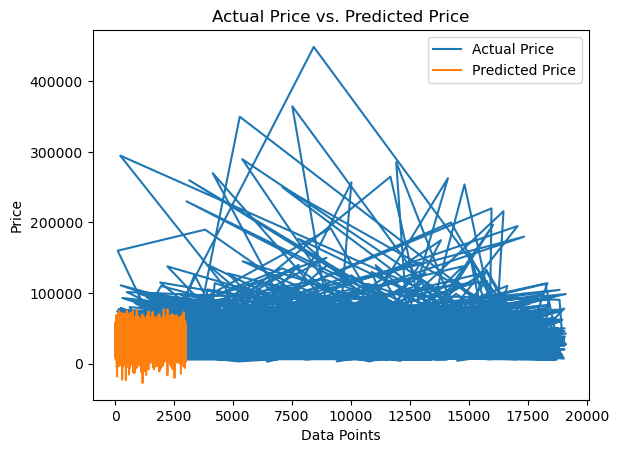

In [28]:

sns.kdeplot(y_test, label='Actual Price')
sns.kdeplot(y_pred, label='Predicted Price')
plt.xlabel('Price')
plt.ylabel('Density')
plt.title('Density Plot of Actual Price and Predicted Price')
plt.legend()
plt.show()

# Visualize the predicted prices vs. the actual prices
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Actual Price vs. Predicted Price')
plt.show()



plt.plot(y_test, label='Actual Price')
plt.plot(y_pred, label='Predicted Price')
plt.xlabel('Data Points')
plt.ylabel('Price')
plt.title('Actual Price vs. Predicted Price')
plt.legend()
plt.show()

residuals = y_test - y_pred
plt.scatter(y_test, residuals)
plt.xlabel('Actual Price')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(0, color='red', linestyle='--')
plt.show()



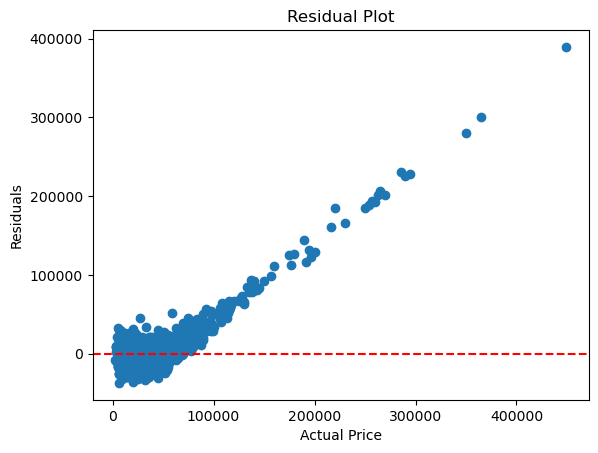